In [1]:
#!nvidia-smi

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
#os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
import sys
import re
from pathlib import Path
import gc
import tqdm
import json
import yadisk
import numpy as np
import pandas as pd
import mediapy as media
from datetime import timedelta
import cv2
from IPython.display import clear_output, display, Video
from PIL import Image
import pytesseract

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms 
from torch import nn
import supervision as sv

import matplotlib.pyplot as plt
import matplotlib.patches as patches

np.random.seed(12345)
torch.manual_seed(12345)
torch.cuda.manual_seed(12345)

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
np.float = float

In [3]:
def imshow_frame(inp, title=None, plt_ax=plt,  mode=None, color = None):
    if mode=='tensor':
        inp = inp.numpy().transpose((1, 2, 0))
        inp = np.clip(inp, 0, 1)
        plt_ax.imshow(inp, 'gray')
    else:
        inp_RGB = cv2.cvtColor(inp, cv2.COLOR_BGR2RGB)
        plt_ax.imshow(inp_RGB, cmap=color)
        #plt_ax.imshow(inp, cmap=color)
    try:
        if title is not None:
            plt_ax.set_title(title)
    except:
        plt.title(title)
    plt_ax.grid(False)

## YOLO TRACKER

In [ ]:
%cd /home/eugene/develop/yolov7-object-tracking

!python detect_and_track.py --weights yolov7.pt --source '/home/eugene/develop/data/output/clear_game.mp4' \
--classes 0 --save-with-object-id --save-bbox-dim --save-txt --device 0

In [ ]:
video = media.read_video('/home/eugene/develop/yolov7-object-tracking/runs/detect/object_tracking17/clear_game.mp4')
media.show_video(video, fps=25)

На примере идентификатора судьи хорошо видно, как за несколько секунд меняется трек-номер у одного объекта отслеживания.

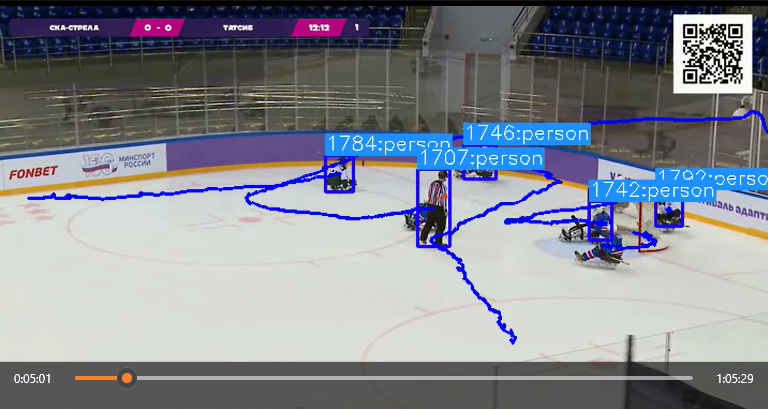

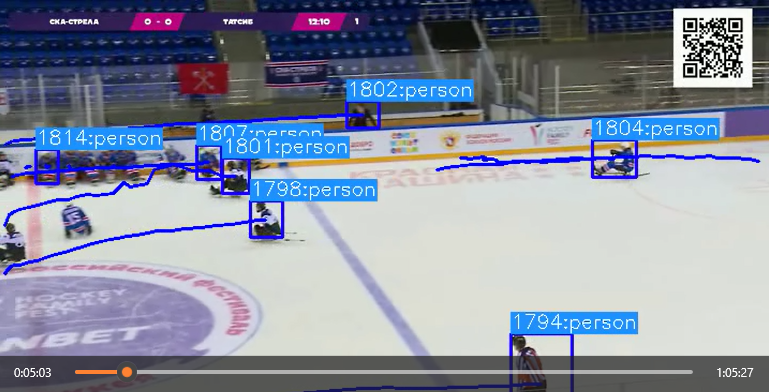

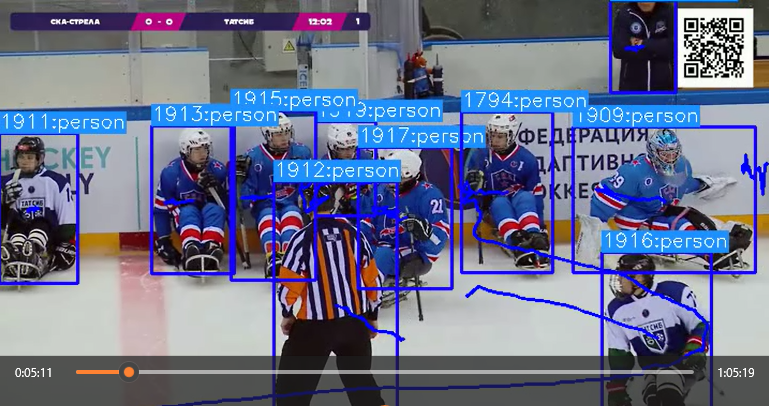

## CoTracker

In [27]:
import timm
import einops

cotracker = torch.hub.load('facebookresearch/co-tracker', 'cotracker_w8').to(device)
from cotracker.utils.visualizer import Visualizer

Using cache found in /home/eugene/.cache/torch/hub/facebookresearch_co-tracker_main


In [28]:
def read_video_from_path(path, start_frame=0, stop_frame=None, step=25):
    cap = cv2.VideoCapture(path)
    count_frame = cap.get(cv2.CAP_PROP_FRAME_COUNT)
    if not cap.isOpened():
        print('Error opening video file')
    if stop_frame is None:
        stop_frame=int(count_frame)
    if start_frame>count_frame or stop_frame>count_frame:
        raise IndexError('list index out of range')
    else:
        frames = []
        for i in range(start_frame, stop_frame, step):
            cap.set(cv2.CAP_PROP_POS_FRAMES,i)
            _, frame = cap.read()
            frames.append(np.array(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)))
        cap.release()
    return np.stack(frames)

Важно отметить, что есть существенные органичения по размеру батча. Поэтому нужно либо увеличивать шаг, либо уменьшать куски видео.

In [29]:
video = read_video_from_path('/home/eugene/develop/data/output/clear_game.mp4', 7850, 10000, step=5)
video = torch.from_numpy(video).permute(0, 3, 1, 2)[None].float().to(device)

In [30]:
video.shape

torch.Size([1, 430, 3, 406, 720])

Прицепим маркеры на игроков (точки отдетектированы ранее)

In [31]:
%%time
queries = torch.tensor([[1., 677., 195.],
                        [1., 237., 314.],
                        [1., 597., 198.0], 
                        [1., 66.0, 232.0],
                        [1., 431., 203.],
                        ]).to(device)
pred_tracks, pred_visibility = cotracker(video, queries=queries[None], backward_tracking=True)

CPU times: user 25.2 s, sys: 682 ms, total: 25.9 s
Wall time: 21 s


In [34]:
vis = Visualizer(
    save_dir='/home/eugene/develop/data/cotracer',
    linewidth=3,
    mode='cool', fps=5,
    tracks_leave_trace=-1
)
vis.visualize(
    video=video,
    tracks=pred_tracks,
    visibility=pred_visibility,
    filename='queries');

Video saved to /home/eugene/develop/data/cotracer/queries_pred_track.mp4


In [ ]:
Video('/home/eugene/develop/data/cotracer/queries_pred_track.mp4', embed=True)

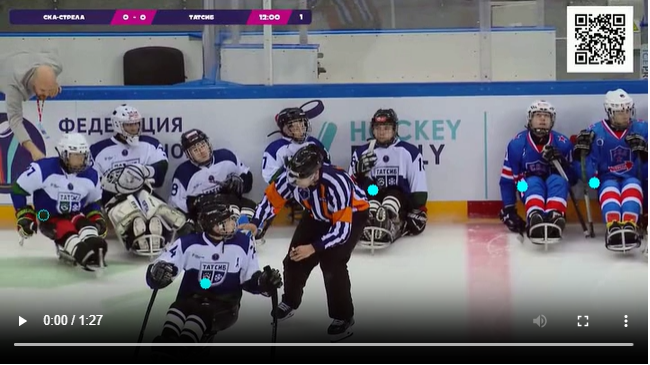

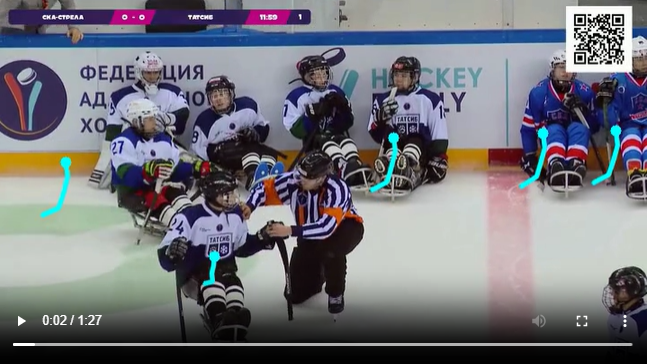

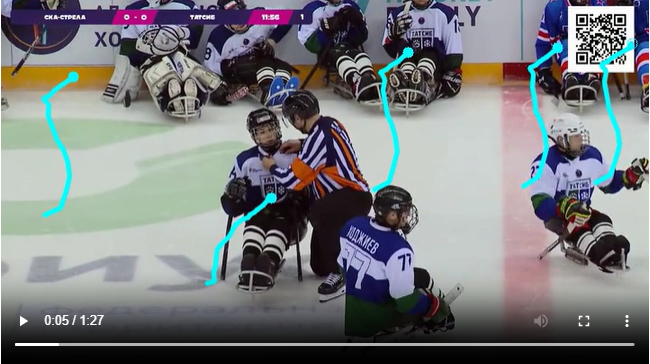

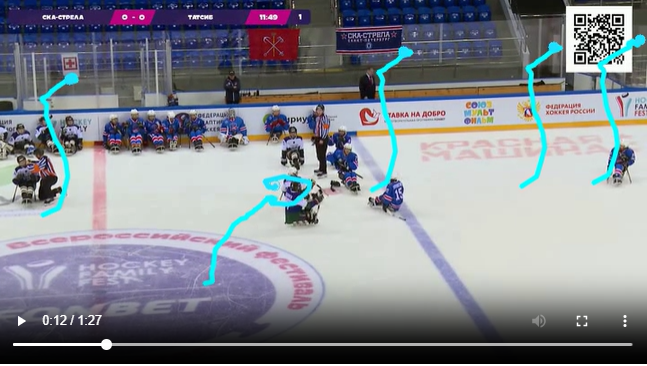

Добавим для наглядности график движения и видимость игроков по фреймам.

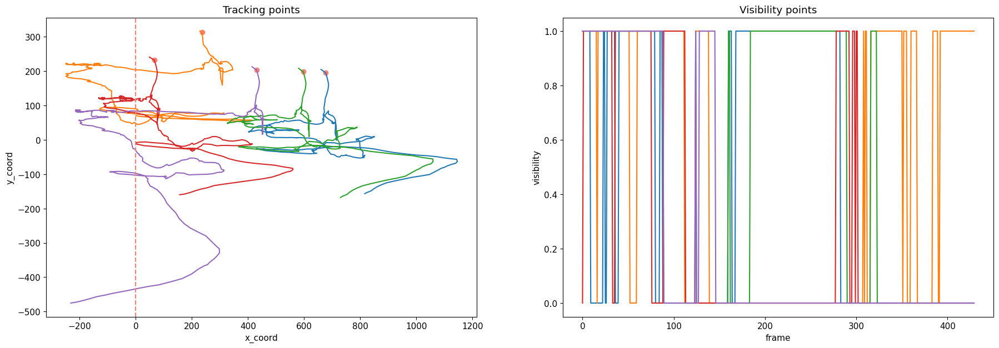

In [37]:
pred = pred_tracks[0].cpu().detach().numpy()
points_start = queries.cpu().detach().numpy()
visibility = pred_visibility[0].cpu().detach().numpy()
x = [i for i in range(len(visibility))]

plt.figure(figsize=(22, 7))
plt.subplot(1, 2, 1)
plt.plot(pred[:,:, 0], pred[:,:, 1])
plt.scatter(points_start[:, 1:][:, 0], points_start[:, 1:][:, 1], color='salmon')
plt.xlabel('x_coord')
plt.ylabel('y_coord')
plt.title('Tracking points')
plt.axvline(x=0, color='salmon', linestyle = '--')

plt.subplot(1, 2, 2)
plt.plot(x, visibility)
plt.xlabel('frame')
plt.ylabel('visibility')
plt.title('Visibility points')
plt.show()

Прогноз будущего расположения точки можно улучшить сокращением шага между фреймами, но даже так, для игроков , которые пропадают на какое то мгновение из видимости нейронной сети, не всегда рассчитывается корректно траектория движения. если у объекста движение интенсивное (как в случае с матчем) - трекинг работает некорректно.

In [87]:
path = '/home/eugene/develop/data/output/clear_game.mp4'

cap = cv2.VideoCapture(path)
count_frame = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps = cap.get(cv2.CAP_PROP_FPS)
cap.release()
one_minute = int(fps*60)
queries = [...].cpu().numpy()
result = np.zeros((1,len(queries)+1))

In [ ]:
def get_tracks(path, queries, range):
    for fr in range:
        if range.step<0:
            stop, step = fr-one_minute, -15
        else:
            stop, step = fr+one_minute, 15
        if len([__ for __ in np.unique(queries[:, 0]) if i in [_ for _ in range(fr,stop,step/abs(step))]])==0:
            return result
        else:
            video = read_video_from_path(path, start = fr, stop = stop, step = step)
            video = torch.from_numpy(video).permute(0, 3, 1, 2)[None].float().to(device)
            pred_tracks, pred_visibility = cotracker(video, queries=queries[None], backward_tracking=True)
            frame = np.array([[i for i in range(fr, stop, step)]]).T
            for i in range(len(queries)):
                if pred_tracks[0][-1][i][0]>0 and pred_tracks[0][-1][i][1]>0:
                    queries[i][1],queries[i][-1] = pred_tracks[0][-1][i][0],pred_tracks[0][-1][i][1]
                    queries[i][0] = fr+range.step
            return np.concatenate([result, np.hstack(frame,pred_visibility)])

In [ ]:
get_tracks(path, queries, range(0, count_frame, one_minute))
get_tracks(path, queries, range(count_frame, 0, -one_minute))

## Tracking-Anything-with-DEVA

In [5]:
%cd /home/eugene/develop/Tracking-Anything-with-DEVA
from argparse import ArgumentParser
from deva.model.network import DEVA
from deva.inference.inference_core import DEVAInferenceCore
from deva.inference.result_utils import ResultSaver
from deva.inference.eval_args import add_common_eval_args, get_model_and_config
from deva.inference.demo_utils import flush_buffer
from deva.ext.ext_eval_args import add_ext_eval_args, add_text_default_args
from deva.ext.grounding_dino import get_grounding_dino_model, segment_with_text
from deva.ext.with_text_processor import process_frame_with_text

import tempfile

torch.autograd.set_grad_enabled(False)

parser = ArgumentParser()
add_common_eval_args(parser)
add_ext_eval_args(parser)
add_text_default_args(parser)

args = parser.parse_args([])
cfg = vars(args)
cfg['enable_long_term'] = True

deva_model = DEVA(cfg).to(device).eval()
if args.model is not None:
    model_weights = torch.load(args.model)
    deva_model.load_weights(model_weights)
else:
    print('No model loaded.')

gd_model, sam_model = get_grounding_dino_model(cfg, 'cuda')

/home/eugene/develop/Tracking-Anything-with-DEVA
final text_encoder_type: bert-base-uncased


In [6]:
SOURCE_VIDEO_PATH = '/home/eugene/develop/data/output/clear_game.mp4'
CLASSES = ['person']
OUTPUT_VIDEO_PATH = '/home/eugene/develop/data/output/clear_game_output.mp4'

In [7]:
cfg['enable_long_term_count_usage'] = True
cfg['max_num_objects'] = 120
cfg['size'] = 480
cfg['DINO_THRESHOLD'] = 0.35
cfg['SAM_THRESHOLD'] = 0.5
cfg['amp'] = True
cfg['chunk_size'] = 15
cfg['detection_every'] = 1
cfg['max_missed_detection_count'] = 1
cfg['sam_variant'] = 'original'
cfg['temporal_setting'] = 'online' 
cfg['pluralize'] = True
cfg['prompt'] = '.'.join(CLASSES)
cfg['model'] = ['D17']
cfg['output']='/home/eugene/develop/data/output/'

In [8]:
deva = DEVAInferenceCore(deva_model, config=cfg)
deva.next_voting_frame = cfg['num_voting_frames'] - 1
deva.enabled_long_id()

In [22]:
def write_new_file(input_file, output_file, fps = 25):
    cap = cv2.VideoCapture(input_file)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fourcc = cv2.VideoWriter_fourcc('X','V','I','D')
    output = cv2.VideoWriter(output_file, fourcc, fps, (width, height))

    return cap, output       

In [ ]:
%%time
ti = 0
out_path = cfg['output']
r = []
result_saver = ResultSaver(out_path, None, dataset='gradio', object_manager=deva.object_manager)
cap, writer = write_new_file(SOURCE_VIDEO_PATH, OUTPUT_VIDEO_PATH)
with torch.cuda.amp.autocast(enabled=cfg['amp']):
    for i in tqdm.tqdm(range(7850, 10000, 1)): #int(cap.get(cv2.CAP_PROP_FRAME_COUNT)), 25)):
        cap.set(cv2.CAP_PROP_POS_FRAMES, i)
        _, frame = cap.read()
        result_saver.writer = writer
        process_frame_with_text(deva, gd_model,sam_model,f'{i}.png',result_saver,ti, image_np=frame)
        ti += 1
    flush_buffer(deva, result_saver)

writer.release()
cap.release()
deva.clear_buffer()

OpenCV: FFMPEG: tag 0x44495658/'XVID' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
100%|██████████| 2150/2150 [49:46<00:00,  1.39s/it]

CPU times: user 1h 10min 2s, sys: 11.1 s, total: 1h 10min 13s
Wall time: 49min 46s


In [ ]:
video = media.read_video('/home/eugene/develop/data/output/clear_game_output.mp4')
media.show_video(video, fps=10)

Здесь более приемлемый результат. При резкой смене ракурса камеры игрок не теряется (см. цвет сегментов). Возьмем к примеру игрока 77 - трекер его держал до момента наезда на другого хоккеиста. Только при этих обстоятельствах был потерян игрок.

Особого внимания требует присутствие артефактов на видео.

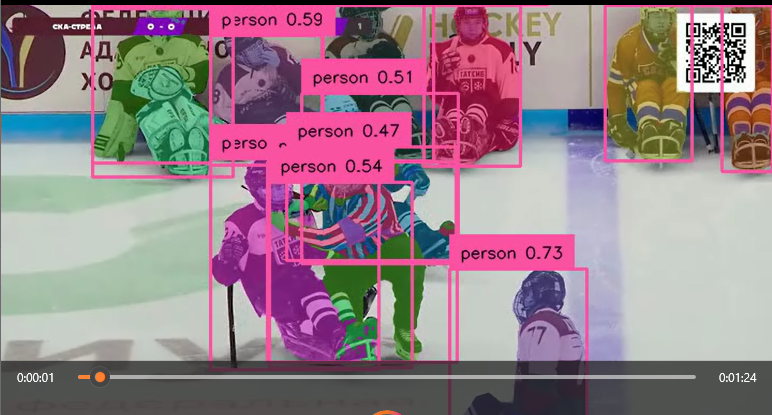

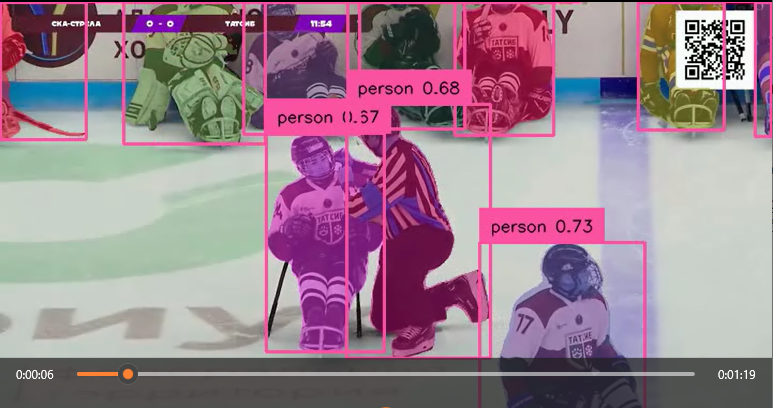

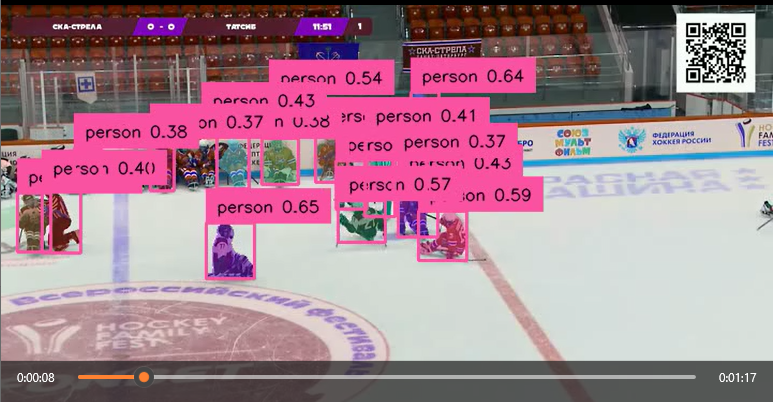

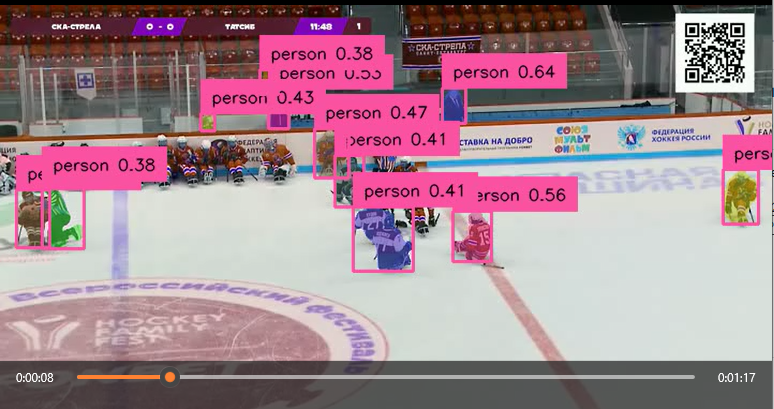


## ByteTrack + YOLO

https://github.com/roboflow/notebooks/blob/main/notebooks/how-to-track-football-players.ipynb

In [4]:
from dataclasses import dataclass

@dataclass(frozen=True)
class BYTETrackerArgs:
    track_thresh: float = 0.25
    track_buffer: int = 30
    match_thresh: float = 0.8
    aspect_ratio_thresh: float = 3.0
    min_box_area: float = 1.0
    mot20: bool = False 

In [5]:
%cd /home/eugene/develop/ByteTrack
from yolox.tracker.byte_tracker import BYTETracker, STrack
from onemetric.cv.utils.iou import box_iou_batch  
from __future__ import annotations
from dataclasses import dataclass, field
from typing import Tuple, Optional, List, Dict, Any

/home/eugene/develop/ByteTrack


In [6]:
@dataclass(frozen=True)
class Point:
    x: float
    y: float
    
    @property
    def int_xy_tuple(self) -> Tuple[int, int]:
        return int(self.x), int(self.y)

@dataclass(frozen=True)
class Rect:
    x: float
    y: float
    width: float
    height: float

    @property
    def min_x(self) -> float:
        return self.x
    
    @property
    def min_y(self) -> float:
        return self.y
    
    @property
    def max_x(self) -> float:
        return self.x + self.width
    
    @property
    def max_y(self) -> float:
        return self.y + self.height
        
    @property
    def top_left(self) -> Point:
        return Point(x=self.x, y=self.y)
    
    @property
    def bottom_right(self) -> Point:
        return Point(x=self.x + self.width, y=self.y + self.height)

    @property
    def bottom_center(self) -> Point:
        return Point(x=self.x + self.width / 2, y=self.y + self.height)

    @property
    def top_center(self) -> Point:
        return Point(x=self.x + self.width / 2, y=self.y)

    @property
    def center(self) -> Point:
        return Point(x=self.x + self.width / 2, y=self.y + self.height / 2)

    def pad(self, padding: float) -> Rect:
        return Rect(x=self.x - padding,  y=self.y - padding, width=self.width + 2*padding, height=self.height + 2*padding)
    
    def contains_point(self, point: Point) -> bool:
        return self.min_x < point.x < self.max_x and self.min_y < point.y < self.max_y

@dataclass
class Detection:
    rect: Rect
    class_id: int
    class_name: str
    confidence: float
    tracker_id: Optional[int] = None

    @classmethod
    def from_results(cls, pred: np.ndarray, names: Dict[int, str]) -> List[Detection]:
        result = []
        for x_min, y_min, x_max, y_max, confidence, class_id in pred:
            class_id=int(class_id)
            result.append(Detection(
                rect=Rect(x=float(x_min), y=float(y_min), width=float(x_max - x_min), height=float(y_max - y_min)),
                class_id=class_id, class_name=names[class_id], confidence=float(confidence)))
        return result

@dataclass(frozen=True)
class Color:
    r: int
    g: int
    b: int
        
    @property
    def bgr_tuple(self) -> Tuple[int, int, int]:
        return self.b, self.g, self.r

    @classmethod
    def from_hex_string(cls, hex_string: str) -> Color:
        r, g, b = tuple(int(hex_string[1 + i:1 + i + 2], 16) for i in (0, 2, 4))
        return Color(r=r, g=g, b=b)


def draw_rect(image: np.ndarray, rect: Rect, color: Color, thickness: int = 2) -> np.ndarray:
    cv2.rectangle(image, rect.top_left.int_xy_tuple, rect.bottom_right.int_xy_tuple, color.bgr_tuple, thickness)
    return image

def draw_filled_rect(image: np.ndarray, rect: Rect, color: Color) -> np.ndarray:
    cv2.rectangle(image, rect.top_left.int_xy_tuple, rect.bottom_right.int_xy_tuple, color.bgr_tuple, -1)
    return image

def draw_polygon(image: np.ndarray, countour: np.ndarray, color: Color, thickness: int = 2) -> np.ndarray:
    cv2.drawContours(image, [countour], 0, color.bgr_tuple, thickness)
    return image

def draw_filled_polygon(image: np.ndarray, countour: np.ndarray, color: Color) -> np.ndarray:
    cv2.drawContours(image, [countour], 0, color.bgr_tuple, -1)
    return image

def draw_text(image: np.ndarray, anchor: Point, text: str, color: Color, thickness: int = 2) -> np.ndarray:
    cv2.putText(image, text, anchor.int_xy_tuple, cv2.FONT_HERSHEY_SIMPLEX, 0.7, color.bgr_tuple, thickness, 2, False)
    return image


def draw_ellipse(image: np.ndarray, rect: Rect, color: Color, thickness: int = 2) -> np.ndarray:
    cv2.ellipse(
        image, center=rect.bottom_center.int_xy_tuple, axes=(int(rect.width), int(0.35 * rect.width)),
        angle=0.0, startAngle=-45, endAngle=235,
        color=color.bgr_tuple, thickness=thickness, lineType=cv2.LINE_4)
    return image

@dataclass
class BaseAnnotator:
    colors: List[Color]
    thickness: int

    def annotate(self, image: np.ndarray, detections: List[Detection]) -> np.ndarray:
        annotated_image = image.copy()
        for detection in detections:
            annotated_image = draw_ellipse(
                image=image, rect=detection.rect,
                color=self.colors[detection.class_id], thickness=self.thickness)
        return annotated_image
     

In [7]:
PLAYER_COLOR_HEX = "#00D4BB"
PLAYER_COLOR = Color.from_hex_string(PLAYER_COLOR_HEX)

COLORS = [PLAYER_COLOR]
THICKNESS = 4

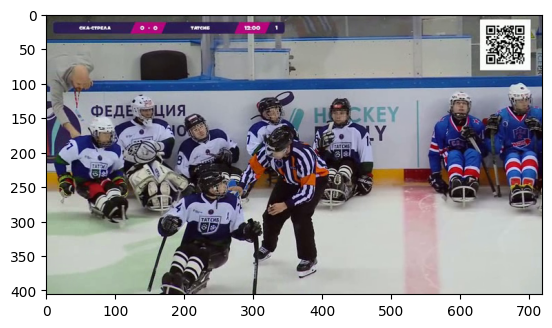

In [11]:
cap = cv2.VideoCapture('/home/eugene/develop/data/output/clear_game.mp4')
cap.set(cv2.CAP_PROP_POS_FRAMES,7850)
_, fr = cap.read()
imshow_frame(fr)

In [ ]:
WEIGHTS_PATH = '/home/eugene/develop/yolov7-object-tracking/yolov7.pt'
model = torch.hub.load('WongKinYiu/yolov7', 'custom', WEIGHTS_PATH)

model = model.to(device)
results = model(fr, size=1280)
results.pandas()

In [13]:
def get_index_class(res, class_):
    df = res.pandas().xyxy[0]
    indexs = []
    for idx, row in df.iterrows():
        if row['class']==class_:
            indexs.append(idx)
    return indexs

indexs = get_index_class(results, 0)

In [14]:
#plt.get_backend()
plt.switch_backend('module://matplotlib_inline.backend_inline')
plt.get_backend()

'module://matplotlib_inline.backend_inline'

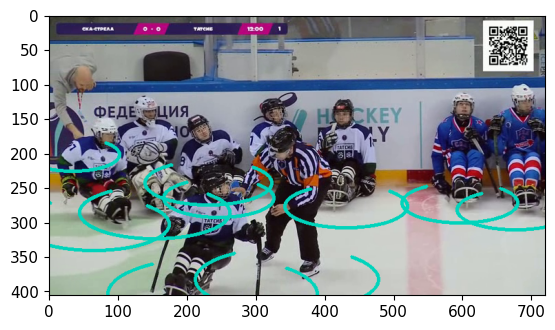

In [15]:
annotator = BaseAnnotator(colors=COLORS, thickness=THICKNESS)
detections = Detection.from_results(pred=results.pred[0][indexs].cpu().numpy(), names=model.names)
annotated_image = annotator.annotate(image=fr, detections=detections)

imshow_frame(annotated_image)

In [18]:
def detections2boxes(detections: List[Detection], with_confidence: bool = True) -> np.ndarray:
    return np.array([
        [detection.rect.top_left.x, detection.rect.top_left.y, detection.rect.bottom_right.x, \
         detection.rect.bottom_right.y, detection.confidence] if with_confidence else \
        [detection.rect.top_left.x, detection.rect.top_left.y,
         detection.rect.bottom_right.x, detection.rect.bottom_right.y]
        for detection in detections], dtype=float)

def tracks2boxes(tracks: List[STrack]) -> np.ndarray:
    return np.array([track.tlbr for track in tracks], dtype=float)

def match_detections_with_tracks(detections: List[Detection], tracks: List[STrack]) -> List[Detection]:
    detection_boxes = detections2boxes(detections=detections, with_confidence=False)
    tracks_boxes = tracks2boxes(tracks=tracks)
    iou = box_iou_batch(tracks_boxes, detection_boxes)
    track2detection = np.argmax(iou, axis=1)
    
    for tracker_index, detection_index in enumerate(track2detection):
        if iou[tracker_index, detection_index] != 0:
            detections[detection_index].tracker_id = tracks[tracker_index].track_id
    return detections
     

In [20]:
@dataclass
class TextAnnotator:
    background_color: Color
    text_color: Color
    text_thickness: int

    def annotate(self, image: np.ndarray, detections: List[Detection]) -> np.ndarray:
        annotated_image = image.copy()
        for detection in detections:
            if detection.tracker_id is None:
                continue
            size, _ = cv2.getTextSize(str(detection.tracker_id), cv2.FONT_HERSHEY_SIMPLEX, 0.7, thickness=self.text_thickness)
            width, height = size
            center_x, center_y = detection.rect.bottom_center.int_xy_tuple
            x = center_x - width // 2
            y = center_y - height // 2 + 10
            annotated_image = draw_filled_rect(image=annotated_image, rect=Rect(x=x, y=y, width=width, height=height).pad(padding=5), color=self.background_color)

            annotated_image = draw_text(image=annotated_image, anchor=Point(x=x, y=y + height),
                text=str(detection.tracker_id), color=self.text_color, thickness=self.text_thickness)
        return annotated_image

In [25]:
%%time
file = '/home/eugene/develop/data/output/clear_game.mp4'
output_file = '/home/eugene/develop/data/output/person_byte.mp4'
cap, output = write_new_file(file, output_file, 10)
text_annotator = TextAnnotator(background_color=Color(255, 255, 255), text_color=Color(0, 0, 0), text_thickness=2)
byte_tracker = BYTETracker(BYTETrackerArgs())


for fr in tqdm.tqdm(range(7850, 10000, 5)):
    cap.set(cv2.CAP_PROP_POS_FRAMES, fr)
    _, frame = cap.read()
    
    results = model(frame, size=1280)
    indexs = get_index_class(results, 0)
    detections = Detection.from_results(
        pred=results.pred[0][indexs].cpu().numpy(), names=model.names)
    tracks = byte_tracker.update(
        output_results=detections2boxes(detections=detections),
        img_info=frame.shape,img_size=frame.shape)
    if len(tracks)==0:
        continue
    else:
        detections = match_detections_with_tracks(detections=detections, tracks=tracks)
        annotated_image = frame.copy()
        annotated_image = text_annotator.annotate(image=annotated_image, detections=detections)
        output.write(annotated_image)

output.release()
cap.release()

OpenCV: FFMPEG: tag 0x44495658/'XVID' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
100%|██████████| 430/430 [00:20<00:00, 20.90it/s]

CPU times: user 36.6 s, sys: 1.52 s, total: 38.1 s
Wall time: 20.6 s


In [ ]:
video = media.read_video('/home/eugene/develop/data/output/person_byte.mp4')
media.show_video(video, fps=5)

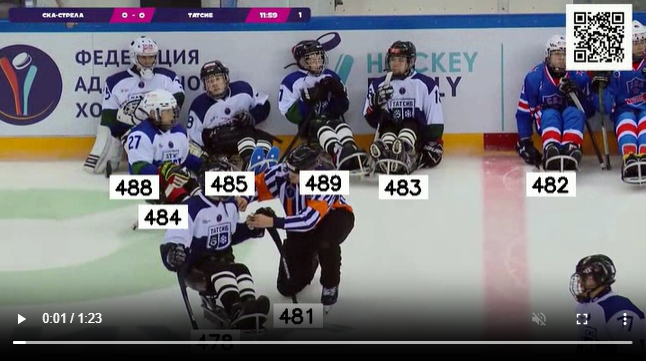

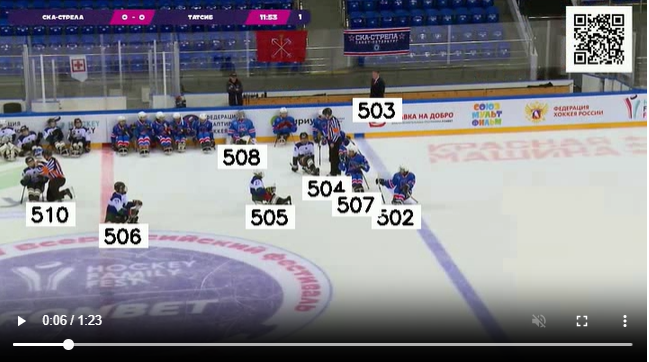

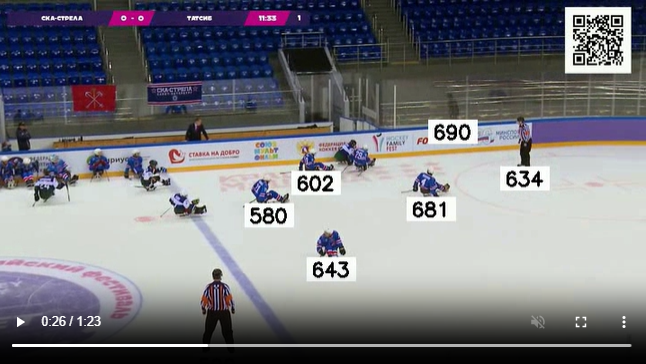

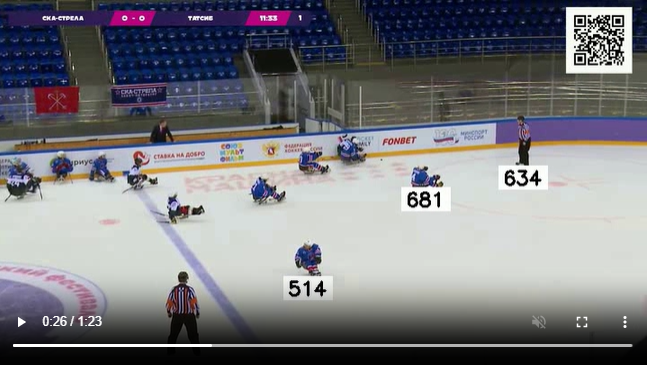

Как и в случае с предыдущим трекером на базе yolo основная проблема - получение нового id для отслеживаемого объекта в случае резкой смены ракурса или наезда на большую кучу отслеживаемых объектов. Например, в пределах пары секунд: игрок 643 перешел в 514, или изменение трек-номера судьи на первых двух кадрах. Игроки, размер которых на кадре небольшой, не отслеживаются, но это можно регулировать с помощью threshold в yolo.